<a href="https://colab.research.google.com/github/Menkallinan/digital-image-processing/blob/main/project/project_part4/normalized_dataset(test).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [23]:
!git clone https://github.com/Menkallinan/digital-image-processing

Cloning into 'digital-image-processing'...
remote: Enumerating objects: 632, done.
remote: Counting objects: 100% (223/223), done.
remote: Compressing objects: 100% (183/183), done.
remote: Total 632 (delta 16), reused 220 (delta 14), pack-reused 409 (from 1)
Receiving objects: 100% (632/632), 529.54 MiB | 35.00 MiB/s, done.
Resolving deltas: 100% (20/20), done.
Updating files: 100% (328/328), done.


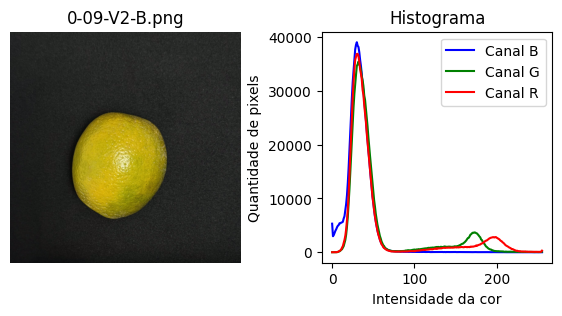

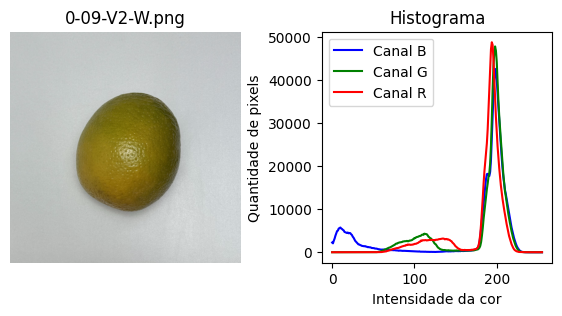

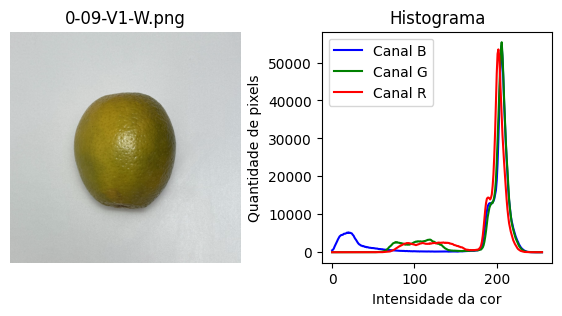

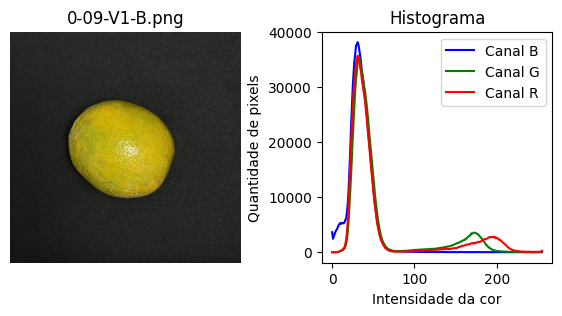

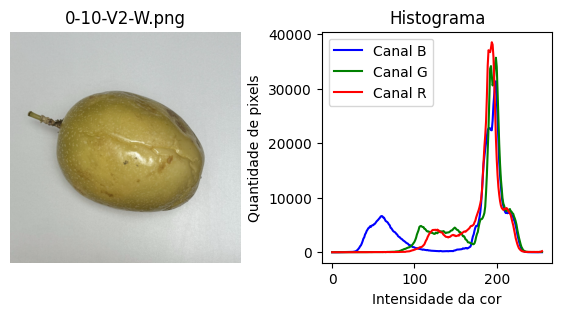

...

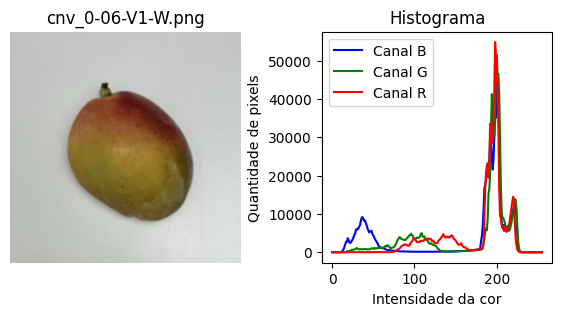

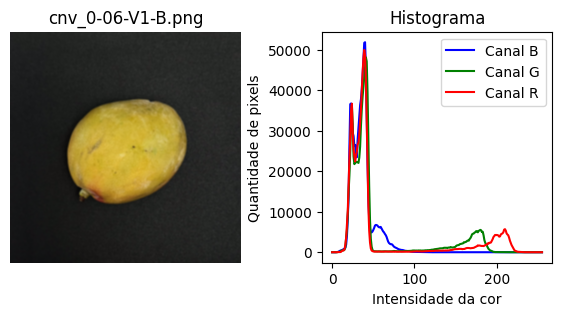

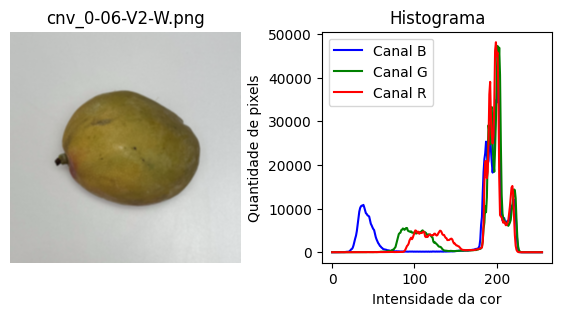

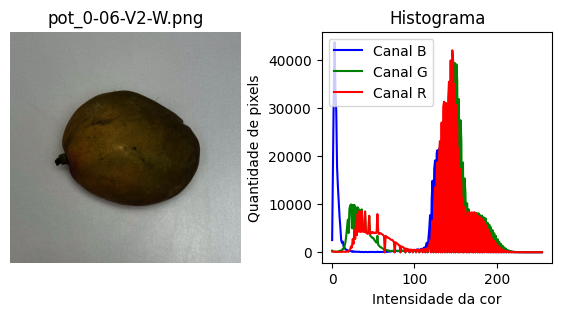

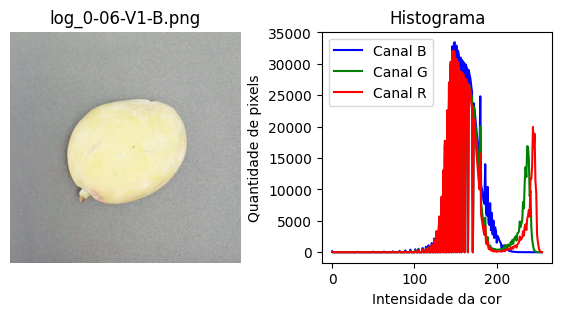

In [61]:
import cv2
import matplotlib.pyplot as plt
import glob
import os

root_dir = 'digital-image-processing/project'

#subdirs_desejados = ['project_part1'] #Utilizando apenas as imagens iniciais da etapa 1, para que não fique muito pesado e seja possível mostrar no Github
subdirs_desejados = ['project_part1', 'project_part3'] #Para utilizar todas imagens necessárias (imagens iniciais + augmented images)

for subdir in subdirs_desejados:

  subdir_path = os.path.join(root_dir, subdir)

  for subdir2, dirs, files in os.walk(subdir_path): #percorre os diretórios de interesse e encontra todos arquivos .png (imagens desejadas)
    for file in files:
      if file.endswith('.png'):

        filepath = os.path.join(subdir2, file)

        img = cv2.imread(filepath)

        b, g, r = cv2.split(img) #Separa os canais b, g e r (azul, verde e vermelho)

        hist_b = cv2.calcHist([b], [0], None, [256], [0, 256]) #Calcula o histograma do canal b (azul)
        hist_g = cv2.calcHist([g], [0], None, [256], [0, 256]) #Calcula o histograma do canal g (verde)
        hist_r = cv2.calcHist([r], [0], None, [256], [0, 256]) #Calcula o histograma do canal r (vermelho)

        fig, axes = plt.subplots(1, 2, figsize=(7, 3))

        #Plota imagem
        axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[0].set_title(file)
        axes[0].axis('off')

        #Plota histograma
        axes[1].plot(hist_b, color='b')
        axes[1].plot(hist_g, color='g')
        axes[1].plot(hist_r, color='r')
        axes[1].set_title('Histograma')
        axes[1].legend(['Canal B', 'Canal G', 'Canal R'])

        plt.xlabel('Intensidade da cor')
        plt.ylabel('Quantidade de pixels')
        plt.subplots_adjust(wspace=0.35)
        plt.show()